In [1]:
#libraries

import pandas as pd
import numpy as np
import requests
import os
from sklearn.cluster import KMeans
import folium 
from geopy.geocoders import Nominatim
import matplotlib.cm as cm
import matplotlib.colors as colors
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe
import geopandas
from unidecode import unidecode
import xlrd 
import matplotlib.pyplot as plt



In [2]:
#request data from wikipedia website
url = "https://pt.wikipedia.org/wiki/Lista_dos_distritos_de_São_Paulo_por_população"
source = requests.get(url)

In [3]:
#create a dataframe with Sao Paulo District Names and Population data
df = pd.read_html(source.content, header=0)[0]
df.head()

#Add HDI and Demographic Density
HDI_data_filepath = "/Users/brunonodomi/Desktop/Coursera/Sao Paulo IDH.xlsx"
df_temp2 = pd.read_excel(HDI_data_filepath, index_col=0)  
df_temp2.reset_index()
df = pd.merge(df,df_temp2, how='left', left_on='Distrito', right_on='Distritos')

#Add Real State data (Price/m2)
RealEstate_data_filepath = "/Users/brunonodomi/Desktop/Coursera/Sao Paulo m2.xlsx"
df_temp3 = pd.read_excel(RealEstate_data_filepath,index_col = 0)
df_temp3.reset_index()
df = pd.merge(df,df_temp3, how='left', left_on='Distrito', right_on='Distrito')

#Clean names data
df.Distrito = df.Distrito.str.upper()
df.Distrito = df.Distrito.apply(lambda x: unidecode(x))
df.drop(["Censo 2000"], axis =1,inplace=True)
df.rename(columns={"Densidade Demográfica (Hab/km²)": "Densidade Demográfica"}, inplace = True)
df.Distrito.replace({"SAO MIGUEL PAULISTA": "SAO MIGUEL", "b": "y"}, inplace=True)
df.dropna(0, inplace=True)

df

,Posição,Distrito,População 2010,IDH,Densidade Demográfica,Regiao,Preço m2
0,1,GRAJAU,444.593,0.754,3922,Sul,3201
1,2,SAPOPEMBA,296.042,0.786,21076,Sudeste,5147
2,3,JARDIM ANGELA,291.798,0.750,7899,Sul,3683
3,4,BRASILANDIA,280.069,0.769,12615,Noroeste,5023
4,5,CAPAO REDONDO,275.230,0.782,19759,Sul,4173
...,...,...,...,...,...,...,...
91,92,JAGUARA,24.114,0.863,5412,Oeste2,5503
92,93,SE,21.564,0.858,11262,Central,5986
93,94,PARI,16.144,0.863,5965,Sudeste,6368
94,95,BARRA FUNDA,12.977,0.917,2568,Oeste2,8670


In [4]:
#Check if all rows are filled
if df.isnull().values.any() == False:
    print("Data is OK")
else:
    print("There are missing data")

Data is OK


In [5]:
df

,Posição,Distrito,População 2010,IDH,Densidade Demográfica,Regiao,Preço m2
0,1,GRAJAU,444.593,0.754,3922,Sul,3201
1,2,SAPOPEMBA,296.042,0.786,21076,Sudeste,5147
2,3,JARDIM ANGELA,291.798,0.750,7899,Sul,3683
3,4,BRASILANDIA,280.069,0.769,12615,Noroeste,5023
4,5,CAPAO REDONDO,275.230,0.782,19759,Sul,4173
...,...,...,...,...,...,...,...
91,92,JAGUARA,24.114,0.863,5412,Oeste2,5503
92,93,SE,21.564,0.858,11262,Central,5986
93,94,PARI,16.144,0.863,5965,Sudeste,6368
94,95,BARRA FUNDA,12.977,0.917,2568,Oeste2,8670


In [6]:
#Get latitude and longitude
df["Adresses"] = df["Distrito"] + ", " + "Sao Paulo, Sao Paulo"
nom = Nominatim(timeout = 5)
lat = []
lon = []

for adress in df.Adresses:
    print(adress)
    lat.append(nom.geocode(adress).latitude)
    lon.append(nom.geocode(adress).longitude)
    
df["Latitude"] = lat
df["Longitude"] = lon
df.head()

GRAJAU, Sao Paulo, Sao Paulo


/Users/brunonodomi/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Using Nominatim with the default "geopy/1.22.0" `user_agent` is strongly discouraged, as it violates Nominatim's ToS https://operations.osmfoundation.org/policies/nominatim/ and may possibly cause 403 and 429 HTTP errors. Please specify a custom `user_agent` with `Nominatim(user_agent="my-application")` or by overriding the default `user_agent`: `geopy.geocoders.options.default_user_agent = "my-application"`. In geopy 2.0 this will become an exception.
  This is separate from the ipykernel package so we can avoid doing imports until


SAPOPEMBA, Sao Paulo, Sao Paulo
JARDIM ANGELA, Sao Paulo, Sao Paulo
BRASILANDIA, Sao Paulo, Sao Paulo
CAPAO REDONDO, Sao Paulo, Sao Paulo
JARDIM SAO LUIS, Sao Paulo, Sao Paulo
CIDADE ADEMAR, Sao Paulo, Sao Paulo
ITAIM PAULISTA, Sao Paulo, Sao Paulo
SACOMA, Sao Paulo, Sao Paulo
JARAGUA, Sao Paulo, Sao Paulo
CIDADE TIRADENTES, Sao Paulo, Sao Paulo
CAMPO LIMPO, Sao Paulo, Sao Paulo
JABAQUARA, Sao Paulo, Sao Paulo
CIDADE DUTRA, Sao Paulo, Sao Paulo
ITAQUERA, Sao Paulo, Sao Paulo
TREMEMBE, Sao Paulo, Sao Paulo
LAJEADO, Sao Paulo, Sao Paulo
VILA JACUI, Sao Paulo, Sao Paulo
PIRITUBA, Sao Paulo, Sao Paulo
VILA CURUCA, Sao Paulo, Sao Paulo
PEDREIRA, Sao Paulo, Sao Paulo
SAO MATEUS, Sao Paulo, Sao Paulo
CACHOEIRINHA, Sao Paulo, Sao Paulo
JARDIM HELENA, Sao Paulo, Sao Paulo
CANGAIBA, Sao Paulo, Sao Paulo
SAO RAFAEL, Sao Paulo, Sao Paulo
PARELHEIROS, Sao Paulo, Sao Paulo
FREGUESIA DO O, Sao Paulo, Sao Paulo
SAO LUCAS, Sao Paulo, Sao Paulo
CIDADE LIDER, Sao Paulo, Sao Paulo
VILA MEDEIROS, Sao Paulo

,Posição,Distrito,População 2010,IDH,Densidade Demográfica,Regiao,Preço m2,Adresses,Latitude,Longitude
0,1,GRAJAU,444.593,0.754,3922,Sul,3201,"GRAJAU, Sao Paulo, Sao Paulo",-23.786248,-46.664993
1,2,SAPOPEMBA,296.042,0.786,21076,Sudeste,5147,"SAPOPEMBA, Sao Paulo, Sao Paulo",-23.604326,-46.509885
2,3,JARDIM ANGELA,291.798,0.750,7899,Sul,3683,"JARDIM ANGELA, Sao Paulo, Sao Paulo",-23.712528,-46.768720
3,4,BRASILANDIA,280.069,0.769,12615,Noroeste,5023,"BRASILANDIA, Sao Paulo, Sao Paulo",-23.448272,-46.690269
4,5,CAPAO REDONDO,275.230,0.782,19759,Sul,4173,"CAPAO REDONDO, Sao Paulo, Sao Paulo",-23.671903,-46.779435


In [7]:
#Clustering according to 10 most common venue categories

'''
I utilized the Foursquare API to explore the boroughs and segment them. 
I designed the limit as 100 venues and the radius 500 meters for each borough from their given latitude and 
longitude information. Here is the header of the result, adding venue id, venue name, 
category, latitude, and longitude information from Foursquare API.
'''

#Fousquare credentials and version
CLIENT_ID = "Y3BOULFILIOATY5RAOVGNAXQBARUD1MSZNVOQINWOL4K2AU4"
CLIENT_SECRET ="0ZDXJJYMEEQRQOZNJ1L2OUQG0HJ2RHZN255FKAWQMRKI1GT2"
VERSION = "20180604"


#Function to get venues within a certain distance (500m)
def getNearbyVenues(names, latitudes, longitudes):
    radius=2000
    LIMIT=500
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name, lat, lng)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}&categoryId={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT,
            "4bf58dd8d48988d1ca941735")

            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [8]:
#Call function above
pizza_venues = getNearbyVenues(names=df['Distrito'],
                                   latitudes=df['Latitude'],
                                   longitudes=df['Longitude']
                                  )

pizza_venues.head(50)


GRAJAU -23.786247600000003 -46.6649926667485
SAPOPEMBA -23.6043265 -46.5098851
JARDIM ANGELA -23.7125278 -46.7687195
BRASILANDIA -23.4482715 -46.69026927092207
CAPAO REDONDO -23.6719026 -46.779435420915036
JARDIM SAO LUIS -23.683573250000002 -46.737762089371984
CIDADE ADEMAR -23.6730116 -46.6552806
ITAIM PAULISTA -23.5017648 -46.3996091
SACOMA -23.6012824 -46.6025552
JARAGUA -23.446658 -46.73621262312861
CIDADE TIRADENTES -23.5824973 -46.4092065
CAMPO LIMPO -23.632557650000003 -46.759666126372395
JABAQUARA -23.6520656 -46.650037329076994
CIDADE DUTRA -23.7139643 -46.6990882
ITAQUERA -23.5360799 -46.4555099
TREMEMBE -22.95714 -45.547526
LAJEADO -23.53624775 -46.41002184740884
VILA JACUI -23.5051091 -46.4519529
PIRITUBA -23.485533 -46.7219385
VILA CURUCA -23.510151 -46.41789278409091
PEDREIRA -22.741347 -46.894846
SAO MATEUS -23.5982995 -46.4817046
CACHOEIRINHA -23.449511450000003 -46.66366119497354
JARDIM HELENA -23.48228355 -46.423410226982504
CANGAIBA -23.5058996 -46.5314253
SAO RAFAE

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,SAPOPEMBA,-23.604326,-46.509885,Ceata Pizzaria,-23.596711,-46.526311,Pizza Place
1,SAPOPEMBA,-23.604326,-46.509885,Rainha do Imperador,-23.592248,-46.511489,Bakery
2,SAPOPEMBA,-23.604326,-46.509885,Abud'z Pizzaria,-23.594956,-46.524894,Pizza Place
3,SAPOPEMBA,-23.604326,-46.509885,Pizzaria Luamar,-23.590725,-46.512311,Pizza Place
4,SAPOPEMBA,-23.604326,-46.509885,Pizzaria D'Linda,-23.612495,-46.506286,Pizza Place
5,SAPOPEMBA,-23.604326,-46.509885,Panificadora Nossa Senhora da Guia,-23.599368,-46.515898,Pizza Place
6,SAPOPEMBA,-23.604326,-46.509885,Brasil Pizzas,-23.604905,-46.522874,Pizza Place
7,SAPOPEMBA,-23.604326,-46.509885,Pizzaria Imperador,-23.595586,-46.503958,Pizza Place
8,SAPOPEMBA,-23.604326,-46.509885,Pizzaria e Esfiharia Grande Família,-23.614887,-46.516166,Pizza Place
9,SAPOPEMBA,-23.604326,-46.509885,Pizzaria Do Máscara,-23.592219,-46.511417,Pizza Place


In [9]:
#Filtered venues specialized on pizza --> exclude bakery and bar
only_pizza_venues = pizza_venues.loc[pizza_venues["Venue Category"] == "Pizza Place"]
only_pizza_venues

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,SAPOPEMBA,-23.604326,-46.509885,Ceata Pizzaria,-23.596711,-46.526311,Pizza Place
2,SAPOPEMBA,-23.604326,-46.509885,Abud'z Pizzaria,-23.594956,-46.524894,Pizza Place
3,SAPOPEMBA,-23.604326,-46.509885,Pizzaria Luamar,-23.590725,-46.512311,Pizza Place
4,SAPOPEMBA,-23.604326,-46.509885,Pizzaria D'Linda,-23.612495,-46.506286,Pizza Place
5,SAPOPEMBA,-23.604326,-46.509885,Panificadora Nossa Senhora da Guia,-23.599368,-46.515898,Pizza Place
...,...,...,...,...,...,...,...
3635,BARRA FUNDA,-23.525462,-46.667513,Rainha das Perdizes,-23.528135,-46.682175,Pizza Place
3636,BARRA FUNDA,-23.525462,-46.667513,Forneria Vila Pompeia,-23.530661,-46.681450,Pizza Place
3637,BARRA FUNDA,-23.525462,-46.667513,Sapori d Italia,-23.521767,-46.651584,Pizza Place
3638,BARRA FUNDA,-23.525462,-46.667513,Graxa Discos Perdizes,-23.536401,-46.680796,Pizza Place


In [10]:
#Count number of pizzerias per neighborhood
count_pizza_venues = only_pizza_venues.groupby(["Neighborhood"]).count()
df = pd.merge(df, count_pizza_venues.Venue, how='left', left_on='Distrito', right_on='Neighborhood')
df.rename(columns={"Venue": "Pizzerias Density"}, inplace = True)




In [11]:
df

,Posição,Distrito,População 2010,IDH,Densidade Demográfica,Regiao,Preço m2,Adresses,Latitude,Longitude,Pizzerias Density
0,1,GRAJAU,444.593,0.754,3922,Sul,3201,"GRAJAU, Sao Paulo, Sao Paulo",-23.786248,-46.664993,NaN
1,2,SAPOPEMBA,296.042,0.786,21076,Sudeste,5147,"SAPOPEMBA, Sao Paulo, Sao Paulo",-23.604326,-46.509885,19.0
2,3,JARDIM ANGELA,291.798,0.750,7899,Sul,3683,"JARDIM ANGELA, Sao Paulo, Sao Paulo",-23.712528,-46.768720,5.0
3,4,BRASILANDIA,280.069,0.769,12615,Noroeste,5023,"BRASILANDIA, Sao Paulo, Sao Paulo",-23.448272,-46.690269,5.0
4,5,CAPAO REDONDO,275.230,0.782,19759,Sul,4173,"CAPAO REDONDO, Sao Paulo, Sao Paulo",-23.671903,-46.779435,22.0
...,...,...,...,...,...,...,...,...,...,...,...
91,92,JAGUARA,24.114,0.863,5412,Oeste2,5503,"JAGUARA, Sao Paulo, Sao Paulo",-23.507446,-46.755315,17.0
92,93,SE,21.564,0.858,11262,Central,5986,"SE, Sao Paulo, Sao Paulo",-23.550390,-46.633081,72.0
93,94,PARI,16.144,0.863,5965,Sudeste,6368,"PARI, Sao Paulo, Sao Paulo",-23.532976,-46.615849,24.0
94,95,BARRA FUNDA,12.977,0.917,2568,Oeste2,8670,"BARRA FUNDA, Sao Paulo, Sao Paulo",-23.525462,-46.667513,63.0


In [12]:
#Get Density of Habitants per Pizzeria
df["Habitants_Pizzeria Score"]= df["Densidade Demográfica"]/df["Pizzerias Density"]


In [13]:
#Exclude not enough data from df
#df.drop(df[df["Pizzerias Density"] < 5].index, inplace=True)

In [14]:
#Mapping
#Competition
state_geo = os.path.join("/Users/brunonodomi/Desktop/Coursera/distritos_sp.geojson")

# Initialize the map:
m = folium.Map(location=[-23.65, -46.65], zoom_start=10)

m.choropleth(
 geo_data=state_geo,
 name='choropleth',
 data=df,
 columns=['Distrito', 'Pizzerias Density'],
 key_on='feature.properties.nomecaps',
 fill_color='YlOrRd',
 fill_opacity=0.7,
 line_opacity=0.2,
 legend_name='Pizzerias Density'
)
folium.LayerControl().add_to(m)

m


/Users/brunonodomi/opt/anaconda3/lib/python3.7/site-packages/folium/folium.py:415: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


In [15]:
#import filepath as geojson file
state_geo = os.path.join("/Users/brunonodomi/Desktop/Coursera/distritos_sp.geojson")


#Populaçao
import geojson
with open(state_geo) as f:
    gj = geojson.load(f)
    
#Plot graph
import plotly.express as px

fig = px.choropleth(df, geojson = gj, color='Pizzerias Density',
                    locations="Distrito", featureidkey="properties.nomecaps",
                    projection="mercator", color_continuous_scale = "agsunset_r"
                   )
fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [16]:
'''
#Population
# Initialize the map:
n = folium.Map(location=[-23.65, -46.65], zoom_start=10)

n.choropleth(
 geo_data=state_geo,
 name='choropleth',
 data=df,
 columns=['Distrito', 'População 2010'],
 key_on='feature.properties.nomecaps',
 fill_color='PuRd',
 fill_opacity=0.7,
 line_opacity=0.2,
 legend_name='Population'
)
folium.LayerControl().add_to(n)

n

'''

"\n#Population\n# Initialize the map:\nn = folium.Map(location=[-23.65, -46.65], zoom_start=10)\n\nn.choropleth(\n geo_data=state_geo,\n name='choropleth',\n data=df,\n columns=['Distrito', 'População 2010'],\n key_on='feature.properties.nomecaps',\n fill_color='PuRd',\n fill_opacity=0.7,\n line_opacity=0.2,\n legend_name='Population'\n)\nfolium.LayerControl().add_to(n)\n\nn\n\n"

In [17]:
#import filepath as geojson file

#Populaçao
import geojson
with open(state_geo) as f:
    gj = geojson.load(f)
    
#Plot graph
import plotly.express as px

fig = px.choropleth(df, geojson = gj, color="População 2010",
                    locations="Distrito", featureidkey="properties.nomecaps",
                    projection="mercator", color_continuous_scale = "sunsetdark"
                   )
fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [18]:
#Plot graph Pop Density
import plotly.express as px

fig = px.choropleth(df, geojson = gj, color="Densidade Demográfica",
                    locations="Distrito", featureidkey="properties.nomecaps",
                    projection="mercator", color_continuous_scale = "sunsetdark"
                   )
fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [19]:
'''
#IDH

# Initialize the map:
o = folium.Map(location=[-23.65, -46.65], zoom_start=10)

o.choropleth(
 geo_data=state_geo,
 name='choropleth',
 data=df,
 columns=['Distrito', 'IDH'],
 key_on='feature.properties.nomecaps',
 fill_color='YlOrRd',
 fill_opacity=0.7,
 line_opacity=0.2,
 legend_name='IDH'
)
folium.LayerControl().add_to(o)

#IDH
o

'''


"\n#IDH\n\n# Initialize the map:\no = folium.Map(location=[-23.65, -46.65], zoom_start=10)\n\no.choropleth(\n geo_data=state_geo,\n name='choropleth',\n data=df,\n columns=['Distrito', 'IDH'],\n key_on='feature.properties.nomecaps',\n fill_color='YlOrRd',\n fill_opacity=0.7,\n line_opacity=0.2,\n legend_name='IDH'\n)\nfolium.LayerControl().add_to(o)\n\n#IDH\no\n\n"

In [20]:
#IDH
    
#Plot graph
import plotly.express as px

fig = px.choropleth(df, geojson = gj, color="IDH",
                    locations="Distrito", featureidkey="properties.nomecaps",
                    projection="mercator", color_continuous_scale = "RdYlGn"
                   )
fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [21]:
"""
#Densidade Demográfica


# Initialize the map:
p = folium.Map(location=[-23.65, -46.65], zoom_start=10)

p.choropleth(
 geo_data=state_geo,
 name='choropleth',
 data=df,
 columns=['Distrito', 'Densidade Demográfica'],
 key_on='feature.properties.nomecaps',
 fill_color='YlOrRd',
 fill_opacity=0.7,
 line_opacity=0.2,
 legend_name='Densidade Demográfica'
)
folium.LayerControl().add_to(p)

#Densidade Demográfica

p

"""

"\n#Densidade Demográfica\n\n\n# Initialize the map:\np = folium.Map(location=[-23.65, -46.65], zoom_start=10)\n\np.choropleth(\n geo_data=state_geo,\n name='choropleth',\n data=df,\n columns=['Distrito', 'Densidade Demográfica'],\n key_on='feature.properties.nomecaps',\n fill_color='YlOrRd',\n fill_opacity=0.7,\n line_opacity=0.2,\n legend_name='Densidade Demográfica'\n)\nfolium.LayerControl().add_to(p)\n\n#Densidade Demográfica\n\np\n\n"

In [22]:
#IDH
#Plot graph
import plotly.express as px

fig = px.choropleth(df, geojson = gj, color="IDH",
                    locations="Distrito", featureidkey="properties.nomecaps",
                    projection="mercator", color_continuous_scale = "agsunset"
                   )
fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show

<bound method BaseFigure.show of Figure({
    'data': [{'coloraxis': 'coloraxis',
              'featureidkey': 'properties.nomecaps',
              'geo': 'geo',
              'geojson': {'features': [{'geometry': {'coordinates': [[[[-46.648614
                                                                     , -23.567189],
                                                                     [-46.653394,
                                                                     -23.563265],
                                                                     [-46.65861,
                                                                     -23.558781],
                                                                     [-46.655482,
                                                                     -23.554765],
                                                                     [-46.6554,
                                                                     -23.554698],
                 

In [23]:
'''
#Habitants_Pizzeria Scor#Habitants_Pizzeria Scor'e

# Initialize the map:
q = folium.Map(location=[-23.65, -46.65], zoom_start=10)

q.choropleth(
 geo_data=state_geo,
 name='choropleth',
 data=df,
 columns=['Distrito', 'Habitants_Pizzeria Score'],
 key_on='feature.properties.nomecaps',
 fill_color='YlOrRd',
 fill_opacity=0.7,
 line_opacity=0.2,
 legend_name='Pizzeria-Habitants Ratio'
)
folium.LayerControl().add_to(q)

q
'''


"\n#Habitants_Pizzeria Scor#Habitants_Pizzeria Scor'e\n\n# Initialize the map:\nq = folium.Map(location=[-23.65, -46.65], zoom_start=10)\n\nq.choropleth(\n geo_data=state_geo,\n name='choropleth',\n data=df,\n columns=['Distrito', 'Habitants_Pizzeria Score'],\n key_on='feature.properties.nomecaps',\n fill_color='YlOrRd',\n fill_opacity=0.7,\n line_opacity=0.2,\n legend_name='Pizzeria-Habitants Ratio'\n)\nfolium.LayerControl().add_to(q)\n\nq\n"

In [24]:
#Habitants_Pizzeria Score
    
#Plot graph
import plotly.express as px

fig = px.choropleth(df, geojson = gj, color="Habitants_Pizzeria Score",
                    locations="Distrito", featureidkey="properties.nomecaps",
                    projection="mercator", color_continuous_scale = "plasma"
                   )
fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [25]:
'''
#Preço m2

# Initialize the map:
r = folium.Map(location=[-23.65, -46.65], zoom_start=10)

r.choropleth(
 geo_data=state_geo,
 name='choropleth',
 data=df,
 columns=['Distrito', 'Preço m2'],
 key_on='feature.properties.nomecaps',
 fill_color='YlOrRd',
 fill_opacity=0.7,
 line_opacity=0.2,
 legend_name='Preço m2'
)
folium.LayerControl().add_to(r)

r
'''



"\n#Preço m2\n\n# Initialize the map:\nr = folium.Map(location=[-23.65, -46.65], zoom_start=10)\n\nr.choropleth(\n geo_data=state_geo,\n name='choropleth',\n data=df,\n columns=['Distrito', 'Preço m2'],\n key_on='feature.properties.nomecaps',\n fill_color='YlOrRd',\n fill_opacity=0.7,\n line_opacity=0.2,\n legend_name='Preço m2'\n)\nfolium.LayerControl().add_to(r)\n\nr\n"

In [26]:
#import filepath as geojson file
import geojson
with open(state_geo) as f:
    gj = geojson.load(f)
    
#Plot graph
import plotly.express as px

fig = px.choropleth(df, geojson = gj, color="Preço m2",
                    locations="Distrito", featureidkey="properties.nomecaps",
                    projection="mercator", color_continuous_scale = "ylorRd"
                   )
fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()



In [27]:
##Clustering
#columns_to_cluster = ["IDH","Densidade Demográfica"]
df2 = df[["Distrito","IDH","Preço m2","Habitants_Pizzeria Score"]]

In [28]:
df2 = df2.fillna(0)

In [29]:
df2

,Distrito,IDH,Preço m2,Habitants_Pizzeria Score
0,GRAJAU,0.754,3201,0.000000
1,SAPOPEMBA,0.786,5147,1109.263158
2,JARDIM ANGELA,0.750,3683,1579.800000
3,BRASILANDIA,0.769,5023,2523.000000
4,CAPAO REDONDO,0.782,4173,898.136364
...,...,...,...,...
91,JAGUARA,0.863,5503,318.352941
92,SE,0.858,5986,156.416667
93,PARI,0.863,6368,248.541667
94,BARRA FUNDA,0.917,8670,40.761905


In [30]:
#Normalize over MinmaxScaler to get 0 to 1 values (instead of 0 mean of StandardScaler())
from sklearn.preprocessing import MinMaxScaler
#from sklearn.preprocessing import StandardScaler

X = df2.values[:,1:]
Clus_dataSet = MinMaxScaler().fit_transform(X)

In [31]:
from sklearn.cluster import KMeans

sum_of_squared_distances =[]
K = range(1,15)
for k in K:
    kmeans = KMeans(n_clusters=k).fit(Clus_dataSet)
    sum_of_squared_distances.append(kmeans.inertia_)
    

Text(0.5, 1.0, 'Elbow method for Optimal K')

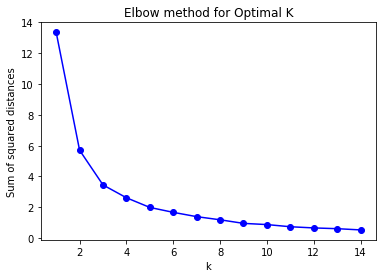

In [32]:
plt.plot(K,sum_of_squared_distances,"bo-")
plt.xlabel("k")
plt.ylabel("Sum of squared distances")
plt.title("Elbow method for Optimal K")

In [33]:
#Modeling
clusterNum = 5
k_means = KMeans(init = "k-means++", n_clusters = clusterNum, n_init = 12)
k_means.fit(X)
labels = k_means.labels_
print(labels)

[2 1 2 2 2 2 2 2 1 1 2 2 1 2 2 1 2 2 1 2 0 2 1 2 2 2 2 1 1 2 1 0 2 2 1 4 1
 2 4 2 1 2 1 2 2 4 1 1 1 1 2 2 1 1 1 1 1 1 1 1 1 3 1 3 1 1 3 1 2 1 1 1 3 3
 4 4 4 4 1 1 4 1 1 3 2 1 1 4 1 1 1 1 1 1 4 2]


In [34]:
df["Clus_km"] = labels
df.head(5)

,Posição,Distrito,População 2010,IDH,Densidade Demográfica,Regiao,Preço m2,Adresses,Latitude,Longitude,Pizzerias Density,Habitants_Pizzeria Score,Clus_km
0,1,GRAJAU,444.593,0.754,3922,Sul,3201,"GRAJAU, Sao Paulo, Sao Paulo",-23.786248,-46.664993,NaN,NaN,2
1,2,SAPOPEMBA,296.042,0.786,21076,Sudeste,5147,"SAPOPEMBA, Sao Paulo, Sao Paulo",-23.604326,-46.509885,19.0,1109.263158,1
2,3,JARDIM ANGELA,291.798,0.750,7899,Sul,3683,"JARDIM ANGELA, Sao Paulo, Sao Paulo",-23.712528,-46.768720,5.0,1579.800000,2
3,4,BRASILANDIA,280.069,0.769,12615,Noroeste,5023,"BRASILANDIA, Sao Paulo, Sao Paulo",-23.448272,-46.690269,5.0,2523.000000,2
4,5,CAPAO REDONDO,275.230,0.782,19759,Sul,4173,"CAPAO REDONDO, Sao Paulo, Sao Paulo",-23.671903,-46.779435,22.0,898.136364,2


In [35]:
df4 = pd.DataFrame(X, columns=["IDH","Preço m2","Habitants_Pizzeria Score"]) 
df4["labels"]=df.Clus_km
df4["Distrito"]=df.Distrito
df4["labels"].apply(lambda x:str(x))
df4.fillna(0,inplace =True)


In [36]:
df4

,IDH,Preço m2,Habitants_Pizzeria Score,labels,Distrito
0,0.754,3201,0.000000,2,GRAJAU
1,0.786,5147,1109.263158,1,SAPOPEMBA
2,0.750,3683,1579.800000,2,JARDIM ANGELA
3,0.769,5023,2523.000000,2,BRASILANDIA
4,0.782,4173,898.136364,2,CAPAO REDONDO
...,...,...,...,...,...
91,0.863,5503,318.352941,1,JAGUARA
92,0.858,5986,156.416667,1,SE
93,0.863,6368,248.541667,1,PARI
94,0.917,8670,40.761905,4,BARRA FUNDA


In [37]:
#transform object type to float type, so it can be used to plot as size parameter
df4.loc[:,'IDH'] = df["IDH"].astype(np.float)
df4.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 96 entries, 0 to 95
Data columns (total 5 columns):
IDH                         96 non-null float64
Preço m2                    96 non-null int64
Habitants_Pizzeria Score    96 non-null float64
labels                      96 non-null int32
Distrito                    96 non-null object
dtypes: float64(2), int32(1), int64(1), object(1)
memory usage: 3.5+ KB


In [38]:
df4

,IDH,Preço m2,Habitants_Pizzeria Score,labels,Distrito
0,0.754,3201,0.000000,2,GRAJAU
1,0.786,5147,1109.263158,1,SAPOPEMBA
2,0.750,3683,1579.800000,2,JARDIM ANGELA
3,0.769,5023,2523.000000,2,BRASILANDIA
4,0.782,4173,898.136364,2,CAPAO REDONDO
...,...,...,...,...,...
91,0.863,5503,318.352941,1,JAGUARA
92,0.858,5986,156.416667,1,SE
93,0.863,6368,248.541667,1,PARI
94,0.917,8670,40.761905,4,BARRA FUNDA


[]

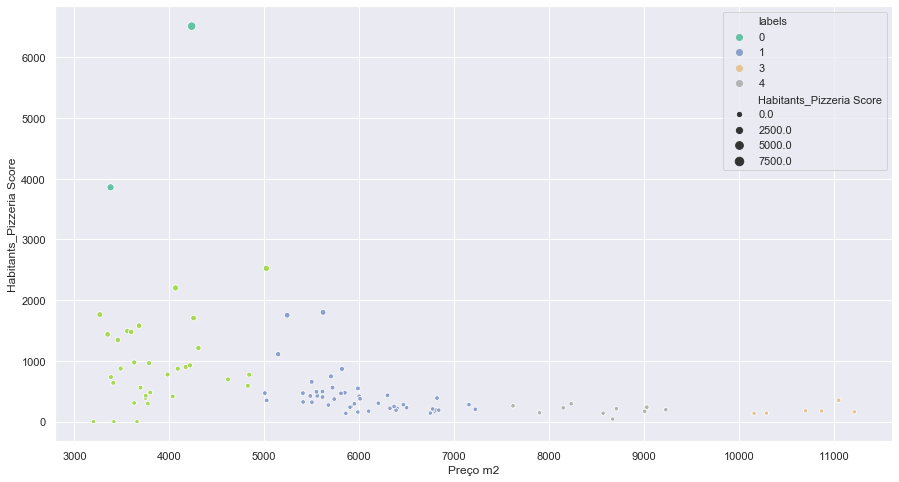

In [39]:
import seaborn as sns; sns.set()
import matplotlib.pyplot as plt

cmap = sns.cubehelix_palette(dark=.3, light=.8, as_cmap=True)


HB_Ratio = df4["Habitants_Pizzeria Score"]
plt.figure(figsize=(15,8))
ax = sns.scatterplot(x="Preço m2", y="Habitants_Pizzeria Score",
                     hue="labels",size = HB_Ratio,
                     palette="Set2",
                     data = df4)
ax.plot()

In [40]:
fig = px.scatter(df4, x="Preço m2", y="IDH",
             size="Habitants_Pizzeria Score", color="labels",
             hover_name="Distrito",trendline="ols",color_continuous_scale ="Portland",
             log_x=True, size_max=60, width=1000, height=600)

fig.show()

In [41]:
#import filepath as geojson file
import geojson
with open(state_geo) as f:
    gj = geojson.load(f)
    
#Plot graph
import plotly.express as px

fig = px.choropleth(df4, geojson = gj, color="labels",
                    locations="Distrito", featureidkey="properties.nomecaps",
                    projection="mercator", color_continuous_scale ="Portland"
                   )
fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0},
                title_text='São Paulo')
fig.show()


In [42]:
df_fig1 = df
df_fig1.rename(columns={'Distrito':'District',
                          'População 2010':'Population',
                          'IDH':'HDI',
                          'Densidade Demográfica': 'Pop_Density',
                          'Regiao':'Zone',
                          'Preço m2':'Price per m2'
                       }, 
                 inplace=True)
df_fig1.head()

,Posição,District,Population,HDI,Pop_Density,Zone,Price per m2,Adresses,Latitude,Longitude,Pizzerias Density,Habitants_Pizzeria Score,Clus_km
0,1,GRAJAU,444.593,0.754,3922,Sul,3201,"GRAJAU, Sao Paulo, Sao Paulo",-23.786248,-46.664993,NaN,NaN,2
1,2,SAPOPEMBA,296.042,0.786,21076,Sudeste,5147,"SAPOPEMBA, Sao Paulo, Sao Paulo",-23.604326,-46.509885,19.0,1109.263158,1
2,3,JARDIM ANGELA,291.798,0.750,7899,Sul,3683,"JARDIM ANGELA, Sao Paulo, Sao Paulo",-23.712528,-46.768720,5.0,1579.800000,2
3,4,BRASILANDIA,280.069,0.769,12615,Noroeste,5023,"BRASILANDIA, Sao Paulo, Sao Paulo",-23.448272,-46.690269,5.0,2523.000000,2
4,5,CAPAO REDONDO,275.230,0.782,19759,Sul,4173,"CAPAO REDONDO, Sao Paulo, Sao Paulo",-23.671903,-46.779435,22.0,898.136364,2


In [43]:
df_fig1.iloc[:, 2:7]


,Population,HDI,Pop_Density,Zone,Price per m2
0,444.593,0.754,3922,Sul,3201
1,296.042,0.786,21076,Sudeste,5147
2,291.798,0.750,7899,Sul,3683
3,280.069,0.769,12615,Noroeste,5023
4,275.230,0.782,19759,Sul,4173
...,...,...,...,...,...
91,24.114,0.863,5412,Oeste2,5503
92,21.564,0.858,11262,Central,5986
93,16.144,0.863,5965,Sudeste,6368
94,12.977,0.917,2568,Oeste2,8670
